In [1]:
# imports
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.multitest import fdrcorrection
from scipy import stats
from scipy.stats import levene, norm
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.preprocessing import PolynomialFeatures
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import FormatStrFormatter
import matplotlib
import seaborn as sns
from matplotlib.colors import to_rgb
import colorsys
import itertools
from scipy.spatial import distance

plt.rcParams['figure.dpi'] = 600
colors = plt.colormaps["Dark2"].colors
# set Arial as default font
plt.rcParams['font.family'] = 'Arial'
from tqdm import tqdm

# silence warnings because the NN has a lot of them
import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from optuna import create_study
from optuna.trial import Trial
from tensorflow.keras import backend as K
import random

# for saving model params
import pickle

# for feature importance
import shap
from sklearn.metrics import mean_squared_error
import copy
import ast

# Read Model Outputs

All of these .pkl files are generated by `models.ipynb`.

In [2]:
try:
	df_condition_level_data = pd.read_csv('../outputs/condition_level_group_advantage_with_ivs.csv') # mark's version of the cleaning

	# read the models and results from the previous save

	# main models
	with open('../outputs/models.pkl', 'rb') as f:
		MODELS = pickle.load(f)
	with open('../outputs/model_r2_results.pkl', 'rb') as f:
		MODEL_R2_RESULTS = pickle.load(f)
	with open('../outputs/model_rmse_results.pkl', 'rb') as f:
		MODEL_RMSE_RESULTS = pickle.load(f)
	
	# train/test data
	with open('../outputs/train_test_data.pkl', 'rb') as f:
		TRAIN_TEST_DATA = pickle.load(f)

	# bootstrap models and results
	with open('../outputs/bootstrap_r2_results.pkl', 'rb') as f:
		BOOTSTRAP_R2_RESULTS = pickle.load(f)
	with open('../outputs/bootstrap_models.pkl', 'rb') as f:
		BOOTSTRAP_MODELS = pickle.load(f)
	with open('../outputs/bootstrap_rmse_results.pkl', 'rb') as f:
		BOOTSTRAP_RMSE_RESULTS = pickle.load(f)

	# noise robustness models and results
	with open('../outputs/enet_noise_robustness.pkl', 'rb') as f:
		ENETS_NOISE_ROBUSTNESS = pickle.load(f)
	with open('../outputs/enet_noise_robustness_r2_results.pkl', 'rb') as f:
		ENETS_NOISE_ROBUSTNESS_R2_RESULTS = pickle.load(f)
	with open('../outputs/enet_noise_robustness_rmse_results.pkl', 'rb') as f:
		ENETS_NOISE_ROBUSTNESS_RMSE_RESULTS = pickle.load(f)

	# IV lists
	with open('../outputs/iv_lists.pkl', 'rb') as f:
		IV_LISTS = pickle.load(f)
	
	basic_IVs = IV_LISTS['basic_IVs']
	mcgrath_continuous = IV_LISTS['mcgrath_continuous']
	steiner_continuous = IV_LISTS['steiner_continuous']
	laughlin_continuous = IV_LISTS['laughlin_continuous']
	categorical_IVs = IV_LISTS['categorical_IVs']

	print("Model files loaded successfully.")

except FileNotFoundError:
	print("Model files not found. Please run models.ipynb first to generate the outputs.")

Model files loaded successfully.


In [3]:
df_condition_level_data[df_condition_level_data['task']=='Writing Story']

,task,playerCount,strong,weak,Low,Medium,High,Conceptual-Behavioral,Type 1 (Planning),Type 2 (Generate),...,Time Solvability,Type 3 and Type 4 (Objective Correctness),Conflicting Tradeoffs,Solution Scheme Outcome Uncertainty,Eureka Question,Intellectual-Manipulative,Intellective-Judgmental,Creativity Input,Type 6 (Mixed-Motive),wave
114,Writing Story,3,0.923359,1.106073,1,0,0,0.0,0.125,0.4,...,0.291667,0.12,0.2,0.363636,0.0,0.088,0.096,0.916,0,1
115,Writing Story,6,0.918376,1.138170,1,0,0,0.0,0.125,0.4,...,0.291667,0.12,0.2,0.363636,0.0,0.088,0.096,0.916,0,1
116,Writing Story,3,0.900500,1.042608,0,1,0,0.0,0.125,0.4,...,0.291667,0.12,0.2,0.363636,0.0,0.088,0.096,0.916,0,1
117,Writing Story,6,0.958114,1.119171,0,1,0,0.0,0.125,0.4,...,0.291667,0.12,0.2,0.363636,0.0,0.088,0.096,0.916,0,1
118,Writing Story,3,0.954016,1.023305,0,0,1,0.0,0.125,0.4,...,0.291667,0.12,0.2,0.363636,0.0,0.088,0.096,0.916,0,1
119,Writing Story,6,0.946929,1.021956,0,0,1,0.0,0.125,0.4,...,0.291667,0.12,0.2,0.363636,0.0,0.088,0.096,0.916,0,1


# Model-Related Helper Functions

Duplicated from models.ipynb, these helper functions help us run and evaluate the models live as we plot them.

In [4]:
def custom_r2(y_pred, y_actual, wave_a_data, wave_b_data, dv_type):
	# Compute R^2 on the test set, using the training set as a baseline
	naive_prediction_errs = []
	for i, row in wave_b_data.iterrows():
		
		# get all instances of groups of the same size performing 
		# all the tasks in the training set at the same complexity level.
		playerCount = row["playerCount"]
		wave_a_subset = wave_a_data[(wave_a_data["playerCount"] == playerCount) & 
									(wave_a_data["Low"] == row["Low"]) & 
									(wave_a_data["Medium"] == row["Medium"]) &
									(wave_a_data["High"] == row["High"])]
		y_training = np.mean(wave_a_subset[dv_type])
		# predict the value of the DV (in wave_b) using the mean of the training data (from wave_a)
		y_actual_i = row[dv_type]
		fold_err = (y_actual_i - y_training)**2
		naive_prediction_errs.append(fold_err)

	r2 = 1 - np.sum((y_pred - y_actual)**2) / np.sum(naive_prediction_errs)
	
	return r2

In [5]:
def add_interactions(X):
	poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
	return poly.fit_transform(X)

def get_rmse(y_true, y_pred):
	"""
	Calculate RMSE between true and predicted values.
	"""
	return np.sqrt(np.mean((y_true - y_pred) ** 2))

# function for getting RMSE from a trained model (OLS)
def get_rmse_ols(model_ols, X_test, y_true, ivs):
	X_test_ols = sm.add_constant(X_test[ivs].copy(), has_constant='add')
	y_pred_ols = model_ols.predict(X_test_ols)
	rmse_ols = get_rmse(y_true, y_pred_ols)

	return rmse_ols

def get_rmse_for_enet(model_enet, X_test, y_true, ivs):
	X_test_enet = add_interactions(X_test[ivs].copy())
	y_pred_enet = model_enet.predict(X_test_enet)
	rmse_enet = get_rmse(y_true, y_pred_enet)

	return rmse_enet

In [6]:
def set_random_seeds(seed_value=19104):
	random.seed(seed_value)
	np.random.seed(seed_value)
	tf.random.set_seed(seed_value)

# Task Space / Group Advantage Figures

### Plotting Preprocessing

First, we need to take the results dictionaries and wrangle them so that we can plot them better.

In [7]:
def create_plotting_dataframe(results_dict, train_test_data, metric_type):

	# metric types
	assert metric_type in ["R^2", "RMSE"], "metric_type must be either 'R^2' or 'RMSE'"

	plot_rows = []
	for iv, model_dict in results_dict.items():
		for model, wave_dict in model_dict.items():
			for wave, dv_dict in wave_dict.items():
				n_train = train_test_data[wave]["train"].shape[0]
				for dv_type, r2_val in dv_dict.items():
					plot_rows.append({
						"IV": iv,
						"Model": model,
						"Wave": wave,
						"n_train": n_train,
						"DV_Type": dv_type,
						metric_type: r2_val,
						"IV-Model": f"{iv}-{model}"
					})
	return pd.DataFrame(plot_rows)


df_plot_r2 = create_plotting_dataframe(MODEL_R2_RESULTS, TRAIN_TEST_DATA, "R^2")
df_plot_rmse = create_plotting_dataframe(MODEL_RMSE_RESULTS, TRAIN_TEST_DATA, "RMSE")

### Plotting Globals

Some general settings for colors to match the different models/types.

In [8]:
# Map wave names to pretty x-axis labels
wave_pretty = {
	"Wave 1": "10",
	"Wave 2": "15"
}

# set up df_plot versions
df_plot_r2["Wave_Label"] = df_plot_r2["Wave"].map(wave_pretty)
df_plot_rmse["Wave_Label"] = df_plot_rmse["Wave"].map(wave_pretty)

# remove NN for now
if "NN" in df_plot_r2["Model"].unique() or "NN" in df_plot_rmse["Model"].unique():
	df_plot_r2 = df_plot_r2[df_plot_r2["Model"] != "NN"]
	df_plot_rmse = df_plot_rmse[df_plot_rmse["Model"] != "NN"]

# For ordering on x-axis
cat_order = [
	"10",
	"15"
]

# Hue color logic
base_palette = {
	"Task Space": "#1f77b4",   # blue family
	"McGrath Categorical": "#ff7f0e",  # orange family
	"McGrath Subspace": "#2ca02c",  # green family
	"Steiner Subspace": "#d62728",  # red family
	"Laughlin Subspace": "#9467bd"  # purple family
}

marker_dict = {
	"Task Space-OLS":"o","Task Space-E-Net":"s", "Task Space-NN":"^",
	"McGrath Categorical-OLS":"^","McGrath Categorical-E-Net":"v", "McGrath Categorical-NN":"<",
	"McGrath Subspace-OLS":"P","McGrath Subspace-E-Net":"X", "McGrath Subspace-NN":"*",
	"Steiner Subspace-OLS":"D", "Steiner Subspace-E-Net":"*",
	"Laughlin Subspace-OLS":"h", "Laughlin Subspace-E-Net":">"
}

shade_dict = {
	"OLS": 1.55,
	"E-Net": 1.00,
	"NN": 0.75
}

def get_color(iv, model):
	base = base_palette[iv]
	r, g, b = to_rgb(base)
	h, l, s = colorsys.rgb_to_hls(r, g, b)
	l_new = min(1.0, max(0, l * shade_dict[model]))
	r2, g2, b2 = colorsys.hls_to_rgb(h, l_new, s)
	return (r2, g2, b2)

For SHAP/Permutation analysis, we need to group strongly correlated columns together because this prevents another "copy" of the same dimension from existing in the model, unpermuted.

In [9]:
# Define Task Space Groups
pretty_feature_cluster_names = {
	"['Type 2 (Generate)', 'Creativity Input']": "Creative",
	"['Type 3 and Type 4 (Objective Correctness)', 'Decision Verifiability', 'Shared Knowledge', 'Within-System Solution', 'Answer Recognizability', 'Time Solvability', 'Intellective-Judgmental']": "Demonstrably Correct Answer",
	"['Conceptual-Behavioral', 'Intellectual-Manipulative']": "Physical",
	"Type 1 (Planning)": "Type 1 (Planning)",
	"Type 5 (Cognitive Conflict)": "Type 5 (Cognitive Conflict)",
	"Type 6 (Mixed-Motive)": "Type 6 (Mixed-Motive)",
	"Type 7 (Battle)": "Type 7 (Battle)",
	"Type 8 (Performance)": "Type 8 (Performance)",
	"Divisible-Unitary": "Divisible-Unitary",
	"Maximizing": "Maximizing",
	"Optimizing": "Optimizing",
	"Outcome Multiplicity": "Outcome Multiplicity",
	"Solution Scheme Multiplicity": "Solution Scheme Multiplicity",
	"Conflicting Tradeoffs": "Conflicting Tradeoffs",
	"Solution Scheme Outcome Uncertainty": "Solution Scheme Outcome Uncertainty",
	"Eureka Question": "Eureka Question"
}

Show that the clusters are correlated:

In [10]:
df_condition_level_data[['Type 2 (Generate)', 'Creativity Input']].corr()

,Type 2 (Generate),Creativity Input
Type 2 (Generate),1.000000,0.829328
Creativity Input,0.829328,1.000000


In [11]:
df_condition_level_data[['Type 3 and Type 4 (Objective Correctness)', 'Decision Verifiability', 'Shared Knowledge', 'Within-System Solution', 'Answer Recognizability', 'Time Solvability', 'Intellective-Judgmental']].corr()

,Type 3 and Type 4 (Objective Correctness),Decision Verifiability,Shared Knowledge,Within-System Solution,Answer Recognizability,Time Solvability,Intellective-Judgmental
Type 3 and Type 4 (Objective Correctness),1.000000,0.967066,0.928585,0.654567,0.959369,0.975959,0.982612
Decision Verifiability,0.967066,1.000000,0.908816,0.682047,0.972943,0.973843,0.945500
Shared Knowledge,0.928585,0.908816,1.000000,0.611842,0.915565,0.933360,0.961674
Within-System Solution,0.654567,0.682047,0.611842,1.000000,0.721279,0.698743,0.598344
Answer Recognizability,0.959369,0.972943,0.915565,0.721279,1.000000,0.962793,0.946780
Time Solvability,0.975959,0.973843,0.933360,0.698743,0.962793,1.000000,0.959235
Intellective-Judgmental,0.982612,0.945500,0.961674,0.598344,0.946780,0.959235,1.000000


In [12]:
df_condition_level_data[['Conceptual-Behavioral', 'Intellectual-Manipulative']].corr()

,Conceptual-Behavioral,Intellectual-Manipulative
Conceptual-Behavioral,1.000000,0.974784
Intellectual-Manipulative,0.974784,1.000000


## Model Comparisons (by Number of Held-Out Tasks)

In [13]:
def plot_model_comparison(df_plot, iv_to_include, metric_type):
	assert metric_type in ["R^2", "RMSE"]

	unique_hues = df_plot[["IV", "Model", "IV-Model"]].drop_duplicates()
	hue_order = [
		f"{iv}-{model}" for iv in iv_to_include
		for model in ["OLS", "E-Net"] if f"{iv}-{model}" in unique_hues["IV-Model"].values
	]

	def parse_iv_model(ivm):
		if ivm.endswith('-OLS'):
			return ivm[:-4], "OLS"
		elif ivm.endswith('-E-Net'):
			return ivm[:-6], "E-Net"
		else:
			raise ValueError(f"Unknown Model in {ivm}")

	facet_title = {
		"strong": "DV: Strong Group Advantage",
		"weak": "DV: Weak Group Advantage"
	}

	fig, axes = plt.subplots(2, 1, figsize=(8.5, 9), sharex=True, gridspec_kw={'hspace': 0.2})

	for i, dv_type in enumerate(["strong", "weak"]):
		ax = axes[i]
		ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.2f}"))
		dv_data = df_plot[df_plot["DV_Type"] == dv_type]
		
		for ivm in hue_order:
			iv, model = parse_iv_model(ivm)
			dsub = dv_data[(dv_data["IV"] == iv) & (dv_data["Model"] == model)]
			if len(dsub) == 0: continue
			ax.plot(
				dsub["Wave_Label"], dsub[metric_type],
				color=get_color(iv, model),
				marker=marker_dict[ivm],
				markersize=11,
				linestyle="solid" if model == "OLS" else "dashed",
				linewidth=2,
				label=ivm
			)
		if metric_type == "R^2":
			ax.axhline(0, color='black', linestyle=':', linewidth=1.4)
		ax.set_title(facet_title[dv_type], fontsize=17)
		ax.set_xticks(cat_order)
		ax.set_xticklabels(cat_order, ha='center', fontsize=16)
		ax.tick_params(axis='y', labelsize=16)

	axes[-1].set_xlabel("Number of Training Tasks", fontsize=16)
	plt.subplots_adjust(left=0.17, right=0.87, top=0.80, bottom=0.11)
	fig.text(0.01, 0.5, f"Out-of-Sample {metric_type}", va='center', rotation='vertical', fontsize=18)

	# panel labels
	axes[0].text(-0.15, 1.12, "A", transform=axes[0].transAxes, fontsize=24, fontweight='bold', va='top')
	axes[1].text(-0.15, 1.12, "B", transform=axes[1].transAxes, fontsize=24, fontweight='bold', va='top')

	handles = []
	for ivm in hue_order:
		iv, model = parse_iv_model(ivm)
		line = plt.Line2D(
			[0], [0], color=get_color(iv, model), marker=marker_dict[ivm],
			linestyle="solid" if model == "OLS" else "dashed",
			markersize=11, linewidth=2, label=ivm
		)
		handles.append(line)

	def legend_anchor_and_ncol(num_entries, ncol=3):
		nrows = int(np.ceil(num_entries / ncol))
		y_anchor = 0.96 + 0.01 * (nrows)
		return ncol, y_anchor
	
	ncol, y_anchor = legend_anchor_and_ncol(len(hue_order), ncol=3)
	fig.legend(
		handles=handles, fontsize=15, loc='upper center',
		bbox_to_anchor=(0.5, y_anchor), frameon=False, ncol=ncol
	)

	plt.savefig(f"../outputs/model_comparison_vertical_{'_'.join(iv_to_include)}_{metric_type}.png", dpi=600, bbox_inches='tight')
	plt.savefig(f"../outputs/model_comparison_vertical_{'_'.join(iv_to_include)}_{metric_type}.pdf", dpi=600, bbox_inches='tight')
	plt.show()

### RMSE Version

In [14]:
# export this for abdullah
df_plot_rmse.to_csv('../outputs/df_plot_rmse.csv', index=False)

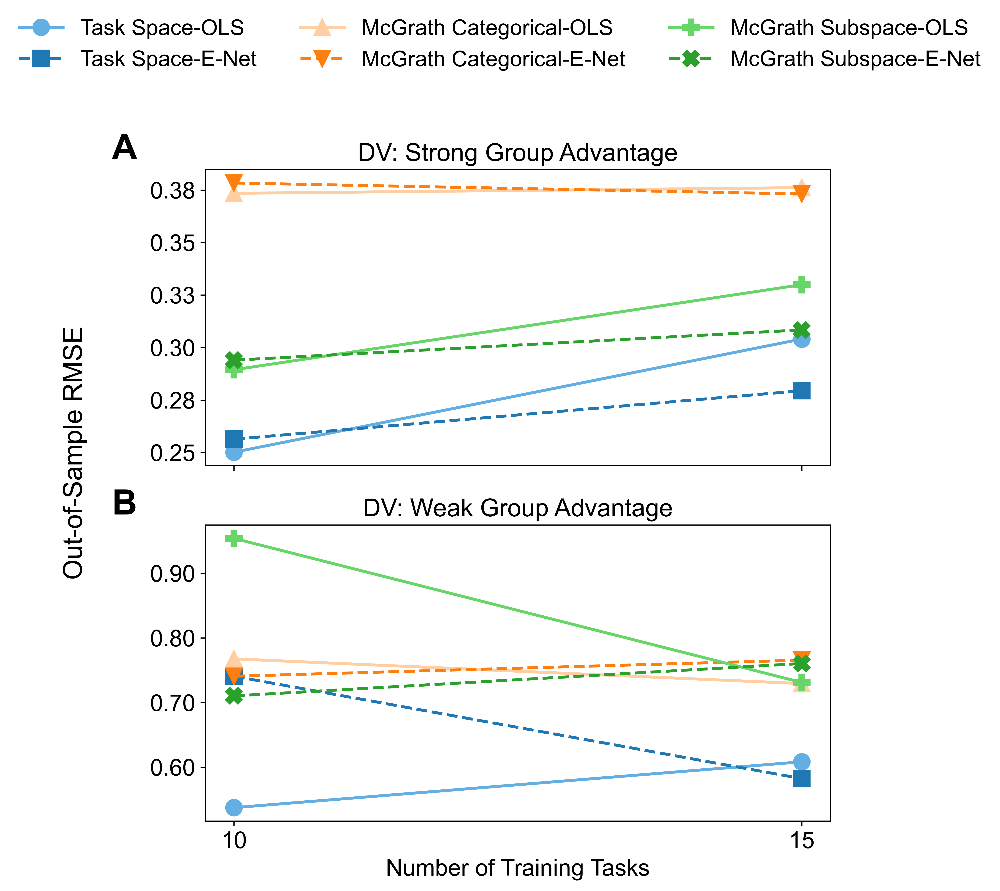

In [15]:
plot_model_comparison(df_plot_rmse, ["Task Space", "McGrath Categorical", "McGrath Subspace"], "RMSE")

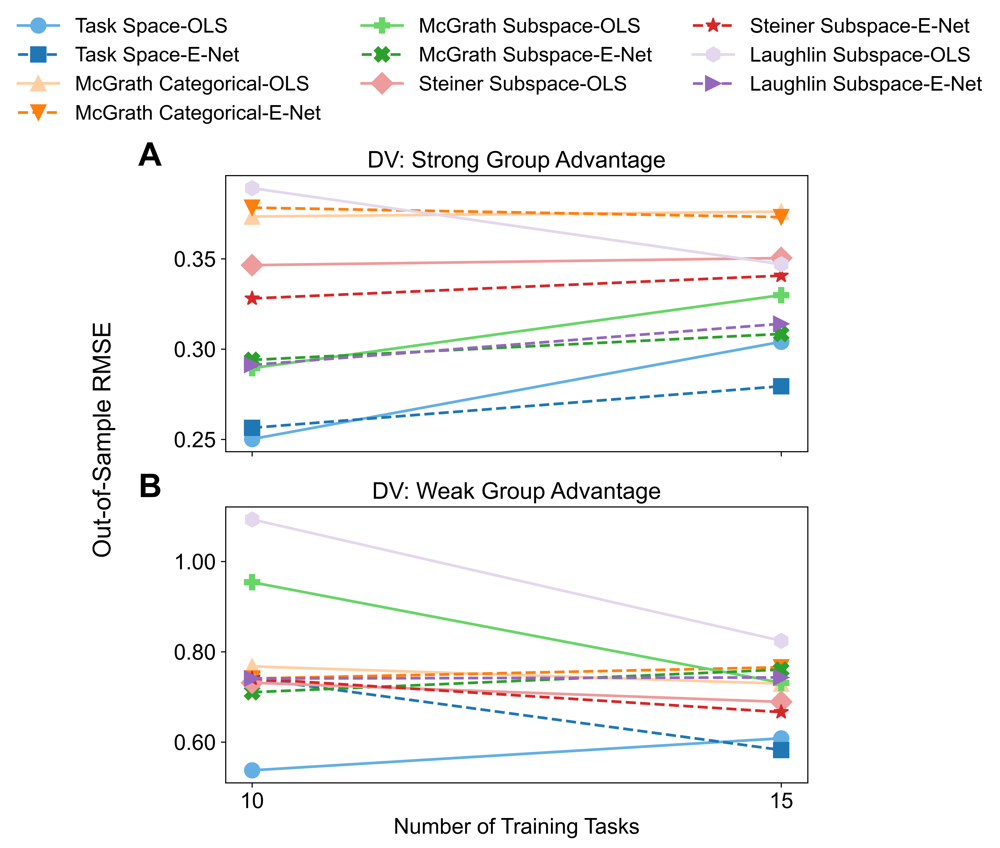

In [16]:
plot_model_comparison(df_plot_rmse, ["Task Space", "McGrath Categorical", "McGrath Subspace", "Steiner Subspace", "Laughlin Subspace"], "RMSE")

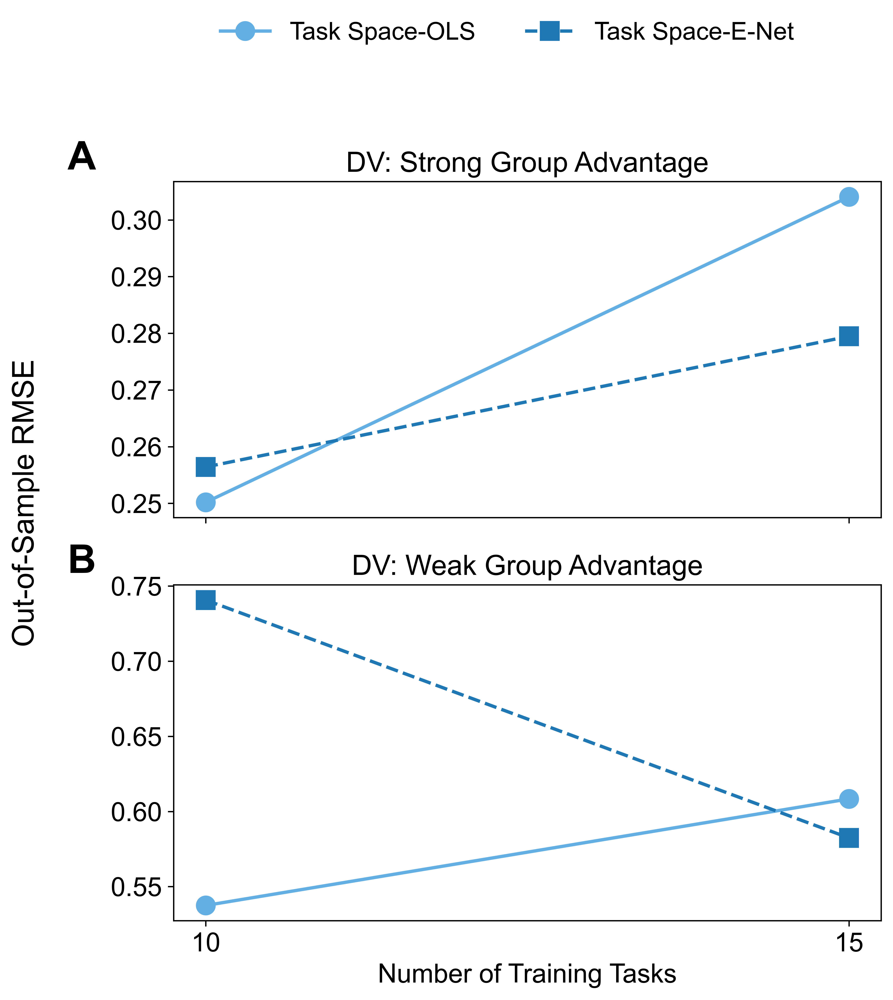

In [17]:
plot_model_comparison(df_plot_rmse, ["Task Space"], "RMSE")

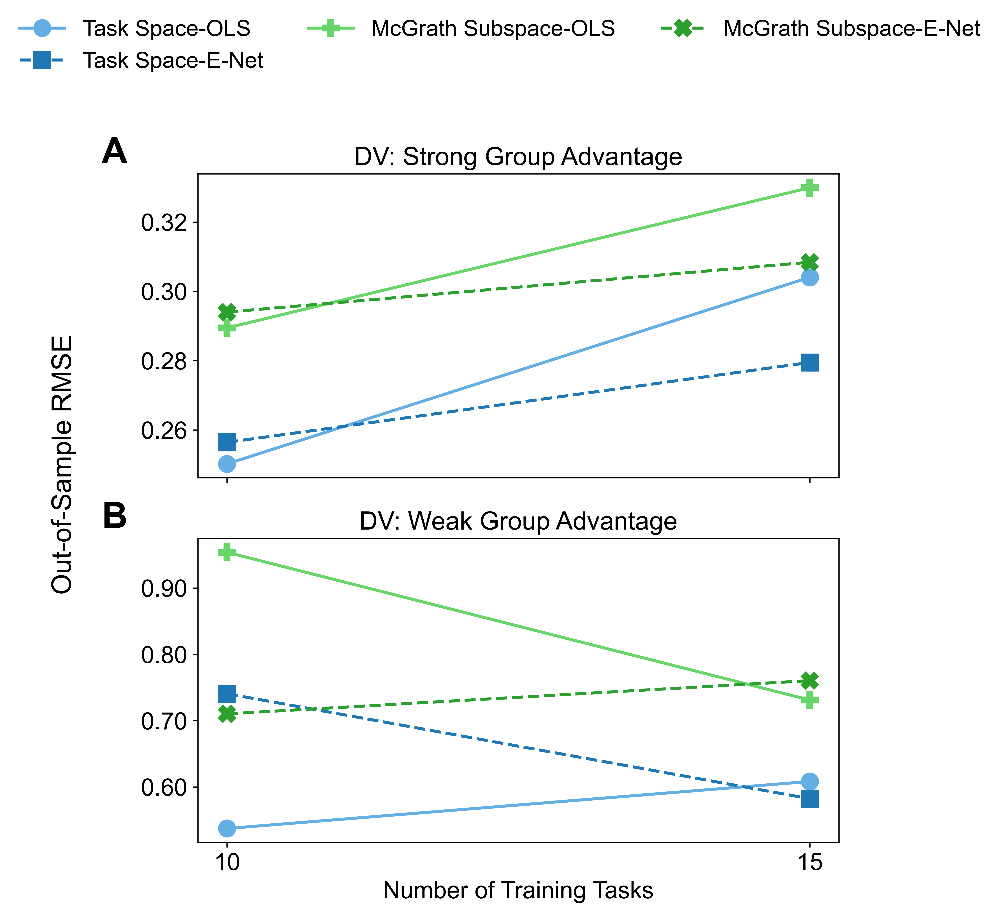

In [18]:
plot_model_comparison(df_plot_rmse, ["Task Space","McGrath Subspace"], "RMSE")

### R^2 Version

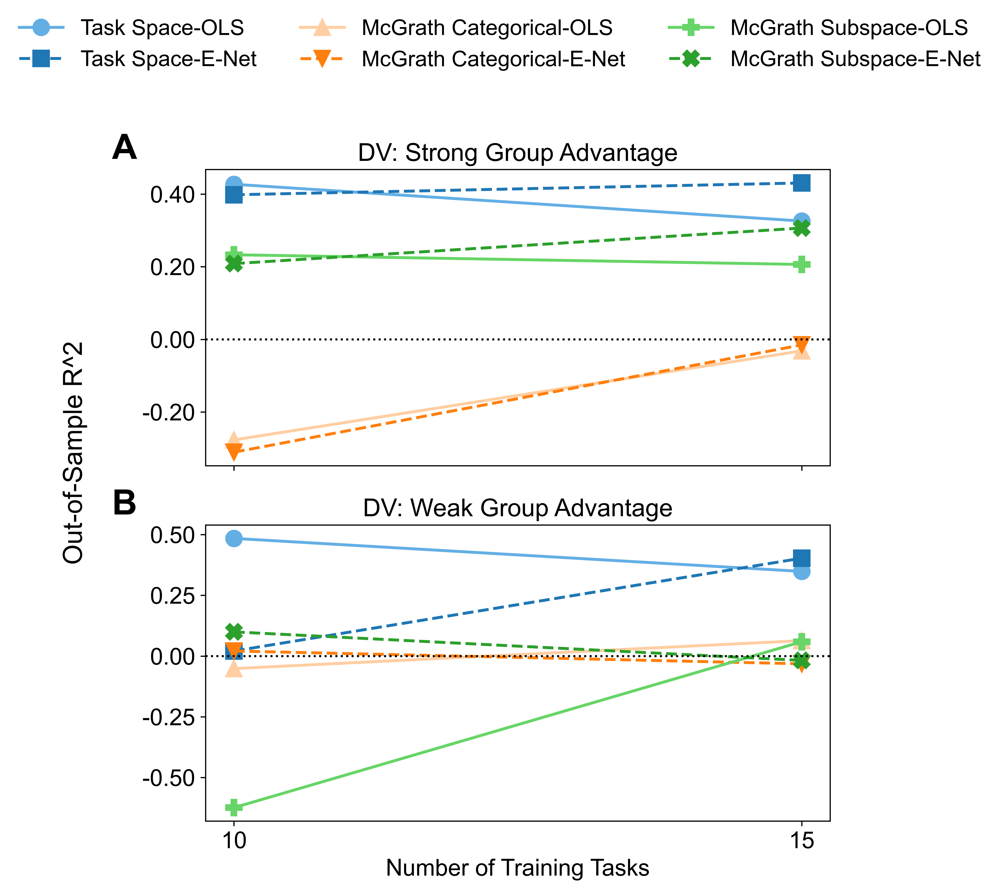

In [19]:
plot_model_comparison(df_plot_r2, ["Task Space", "McGrath Categorical", "McGrath Subspace"], "R^2")

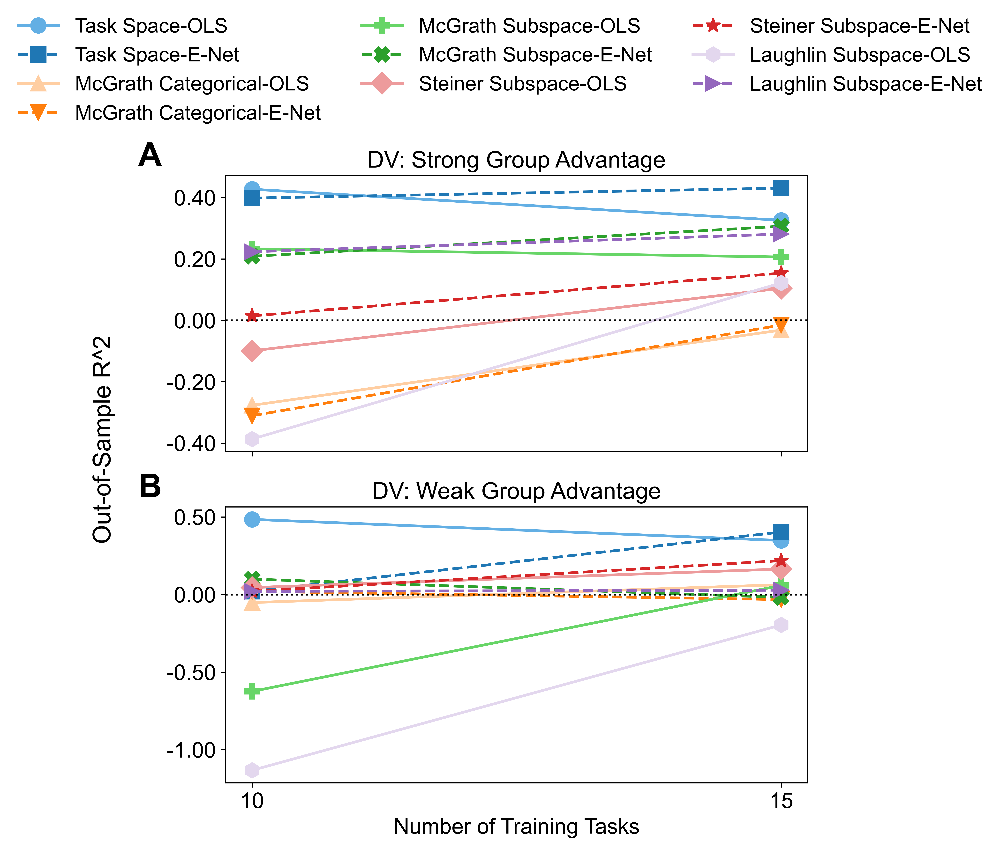

In [20]:
plot_model_comparison(df_plot_r2, ["Task Space", "McGrath Categorical", "McGrath Subspace", "Steiner Subspace", "Laughlin Subspace"], "R^2")

## Model Scatterplot

In [21]:
def plot_group_advantage_pred_vs_obs_strong_weak(
	MODELS, wave, DATA, custom_r2, ivs_selected,
	get_rmse_ols, get_rmse_for_enet,
	models_to_plot=None
):
	fallback_color = "#888"
	fallback_marker = "o"
	dvs = ["strong", "weak"]
	if models_to_plot is None:
		models = ["OLS", "E-Net"]
	else:
		models = [m for m in models_to_plot if m in ["OLS", "E-Net", "NN"]]
	ms = 90

	combos = [(iv, model) for iv in ivs_selected for model in models]
	n_rows = len(ivs_selected)
	n_models = len(models)
	n_cols = len(dvs)

	fig, axes = plt.subplots(n_models * n_rows, n_cols, figsize=(9.3, 3.4 * n_models * n_rows), squeeze=False)

	model_info_list = []

	for iv_i, iv in enumerate(ivs_selected):
		for m_i, model in enumerate(models):
			row = iv_i * n_models + m_i
			color = base_palette.get(iv, fallback_color)
			marker = marker_dict.get(f"{iv}-{model}", fallback_marker)
			if iv == "Task Space": ivs = basic_IVs
			elif iv == "McGrath Categorical": ivs = categorical_IVs
			elif iv == "McGrath Subspace": ivs = mcgrath_continuous
			elif iv == "Steiner Subspace": ivs = steiner_continuous
			elif iv == "Laughlin Subspace": ivs = laughlin_continuous
			else: raise ValueError(f"Unknown IV type: {iv}")

			for col, dv in enumerate(dvs):
				ax = axes[row, col]
				try:
					mdl = MODELS[iv][model][wave][dv]
				except:
					ax.set_xticks([]); ax.set_yticks([])
					ax.set_facecolor("#F6F6F6")
					continue

				Xtest_all = DATA[wave]["test"]
				y = Xtest_all[dv].values
				ytr = DATA[wave]["train"][dv].mean()
				if model == "OLS":
					X = sm.add_constant(Xtest_all[ivs], has_constant='add')
				elif model == "E-Net":
					X = add_interactions(Xtest_all[ivs])
				elif model == "NN":
					X = Xtest_all[ivs]
				else:
					X = Xtest_all[ivs]
				try:
					if hasattr(mdl, "model") and hasattr(mdl.model, "exog_names"):
						needed_cols = mdl.model.exog_names
						X = X.reindex(columns=needed_cols, fill_value=0)
					yhat = mdl.predict(X) if hasattr(mdl, 'predict') else mdl(X)
					if hasattr(yhat, 'flatten'): yhat = yhat.flatten()
					if hasattr(yhat, 'detach'): yhat = yhat.detach().numpy()
				except Exception as e:
					ax.set_xticks([]); ax.set_yticks([])
					ax.set_facecolor("#F6F6F6")
					continue

				if model == "OLS":
					rmse = get_rmse_ols(mdl, Xtest_all, y, ivs)
				elif model == "E-Net":
					rmse = get_rmse_for_enet(mdl, Xtest_all, y, ivs)
				else:
					rmse = np.sqrt(np.mean((yhat - y) ** 2))
				r2 = custom_r2(yhat, y, DATA[wave]['train'], DATA[wave]['test'], dv)
				model_info = {
					"iv": iv,
					"dv": dv,
					"model": model,
					"y_pred": yhat,
					"y_actual": y,
					"rmse": rmse,
					"r2": r2
				}
				model_info_list.append(pd.DataFrame(model_info))

				ax.scatter(y, yhat, color=color, marker=marker, s=ms, alpha=.85)
				mi, ma = min(np.min(y), np.min(yhat)), max(np.max(y), np.max(yhat))
				ax.plot([mi, ma], [mi, ma], 'k--', lw=1, alpha=.4, label='1:1 Line')
				ax.axhline(ytr, color='#D90368', lw=2, label='Training Mean')
				ax.text(.045, .98, f"$R^2$={r2:.2f}\nRMSE={rmse:.2f}",
						ha="left", va="top", transform=ax.transAxes, fontsize=15)
				ax.tick_params(axis="x", labelsize=12)
				ax.tick_params(axis="y", labelsize=12)
				[sp.set_visible(False) for sp in ax.spines.values()]
				ax.set_facecolor('white')

				# X/Y label logic: only bottom row and leftmost column get labels
				if row == n_rows * n_models - 1:
					ax.set_xlabel("Observed", fontsize=15)
				else:
					ax.set_xlabel("")
				if col == 0:
					ax.set_ylabel("Predicted", fontsize=15)
				else:
					ax.set_ylabel("")

	# --- Column/Row Super-Labels
	for col, dv in enumerate(dvs):
		axes[0, col].set_title(f"DV: {'Strong' if dv == 'strong' else 'Weak'}", fontsize=17, fontweight="bold", pad=13)

	fig.canvas.draw()  # Needed to ensure correct bbox info

	for iv_i, iv in enumerate(ivs_selected):
		row_idxs = list(range(iv_i * n_models, (iv_i+1) * n_models))
		block_center_y = (
			axes[row_idxs[0], 0].get_position().y0 
			+ axes[row_idxs[-1], 0].get_position().y1
		) / 2

		x_text = axes[row_idxs[0], 0].get_position().x0 - 0.11
		nudge = 0.01 * (iv_i + 1)  # Nudge down for each IV
		fig.text(
			x_text,
			block_center_y - nudge,
			iv,
			ha='right', va='center', fontsize=16,
			rotation=90, fontweight='bold'
		)
		
	# --- Legend
	le = []
	for iv in ivs_selected:
		if "OLS" in models:
			le.append(Line2D([0], [0], marker=marker_dict.get(f"{iv}-OLS", fallback_marker),
				color=base_palette.get(iv, fallback_color),
				markerfacecolor=base_palette.get(iv, fallback_color), 
				markersize=13, linestyle='None', alpha = 0.85, label=f"{iv} OLS"))
		if "E-Net" in models:
			le.append(Line2D([0], [0], marker=marker_dict.get(f"{iv}-E-Net", fallback_marker),
				color=base_palette.get(iv, fallback_color),
				markerfacecolor=base_palette.get(iv, fallback_color),
				markersize=13, linestyle='None', alpha = 0.85, label=f"{iv} E-Net"))
		if "NN" in models:
			le.append(Line2D([0], [0], marker=marker_dict.get(f"{iv}-NN", fallback_marker),
				color=base_palette.get(iv, fallback_color),
				markerfacecolor=base_palette.get(iv, fallback_color),
				markersize=13, linestyle='None', alpha = 0.85, label=f"{iv} NN"))
	le.append(Line2D([0], [0], color='k', label='1:1 Line', linestyle='--', lw=2, alpha=0.4))
	le.append(Line2D([0], [0], color='#D90368', label='Training Mean', linestyle='-', lw=3))

	handles_model = le[:-2]
	handles_misc  = le[-2:]

	fig.legend(
		handles=handles_model, loc='upper center', fontsize=13,
		ncol=len(handles_model), bbox_to_anchor=(0.5, 1.0), frameon=False
	)
	fig.legend(
		handles=handles_misc, loc='upper center', fontsize=13,
		ncol=len(handles_misc), bbox_to_anchor=(0.5, 0.965), frameon=False
	)
	fig.add_artist(fig.legends[0])
	plt.subplots_adjust(top=0.88, bottom=0.08, left=0.13)

	plt.savefig(f"../outputs/group_advantage_pred_vs_obs_vertical_{wave}_{'_'.join(ivs_selected)}_{'_'.join(models)}.png",
				bbox_inches='tight', dpi=300)
	plt.savefig(f"../outputs/group_advantage_pred_vs_obs_vertical_{wave}_{'_'.join(ivs_selected)}_{'_'.join(models)}.pdf",
				bbox_inches='tight', dpi=300)
	plt.show()

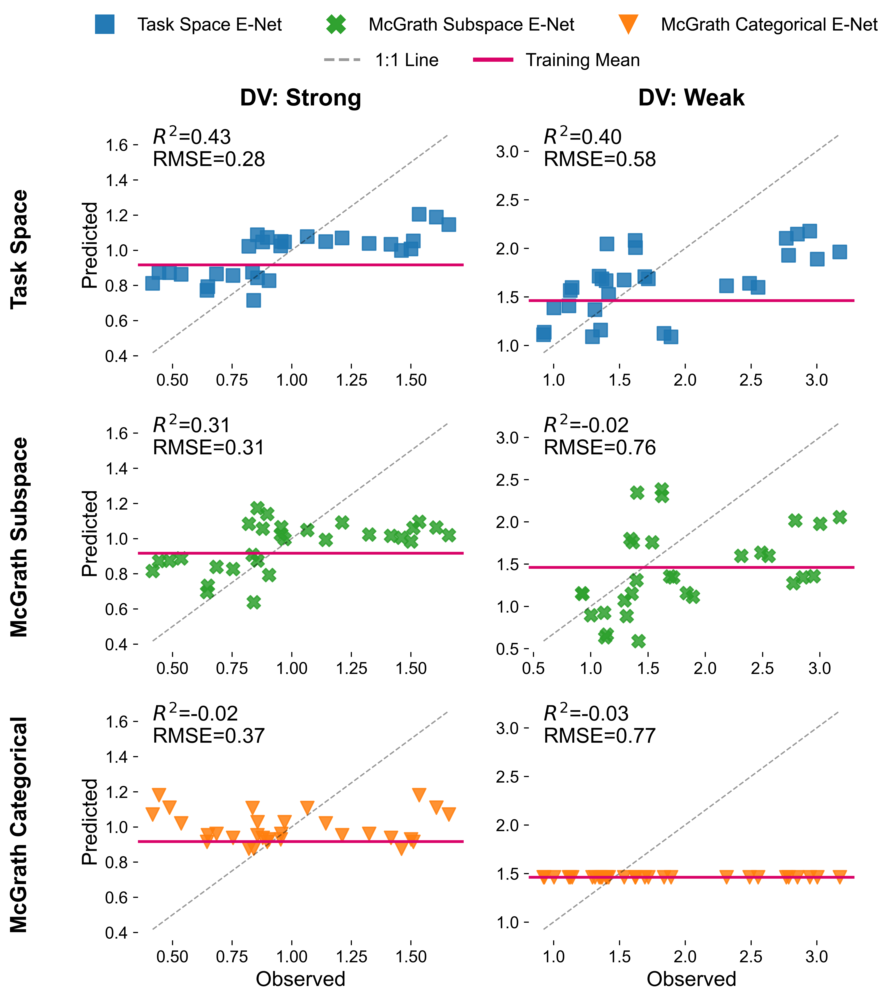

In [22]:
# version with just E-Net
plot_group_advantage_pred_vs_obs_strong_weak(
	MODELS, "Wave 2", TRAIN_TEST_DATA, custom_r2,
	["Task Space", "McGrath Subspace", "McGrath Categorical"],
	get_rmse_ols, get_rmse_for_enet,
	models_to_plot= ["E-Net"] #["OLS", "E-Net"] 
)

Version with OLS for SI

In [23]:
plot_group_advantage_pred_vs_obs_strong_weak(
	MODELS, "Wave 2", TRAIN_TEST_DATA, custom_r2,
	["Task Space", "McGrath Subspace", "McGrath Categorical"],
	get_rmse_ols, get_rmse_for_enet,
	models_to_plot= ["OLS", "NN"] 
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


Version with SI models (Steiner, Laughlin)

In [24]:
plot_group_advantage_pred_vs_obs_strong_weak(MODELS, "Wave 2", TRAIN_TEST_DATA, custom_r2,
											 ["Steiner Subspace", "Laughlin Subspace"],
											 get_rmse_ols, get_rmse_for_enet)

## Bootstrapped Robustness Checks

In [25]:
def analyze_bootstrap_r2_boxplot(bootstrapped_r2_results, plt_title, dv_choice, xlim_min=-5, xlim_max=1.05, xlab='$R^2$'):
	if dv_choice not in ['strong', 'weak']:
		raise ValueError("Invalid DV type. Please choose 'strong' or 'weak'.")

	plot_data = []
	for iv_type, models in bootstrapped_r2_results.items():
		for model_type, dv_types in models.items():
			r2_values = dv_types.get(dv_choice, [])
			if r2_values:
				for r2 in np.atleast_1d(r2_values):
					plot_data.append({
						'IV Type': iv_type,
						'Model Type': f"{iv_type} - {model_type} - {dv_choice}",
						'Model': model_type,
						'R2': r2
					})

	df_plot = pd.DataFrame(plot_data)
	model_types = df_plot['Model'].unique()

	color_dict = {}
	for iv in base_palette.keys():
		for model in model_types:
			for dv in ["strong", "weak"]:
				k = f"{iv} - {model} - {dv}"
				c = get_color(iv, model)
				color_dict[k] = c

	iv_order = list(reversed(list(base_palette.keys())))

	g = sns.FacetGrid(
		df_plot, 
		col="IV Type", 
		col_wrap=1, 
		sharex=False, 
		sharey=False, 
		height=3.6, 
		aspect=1.5, 
		margin_titles=True
	)

	g.map_dataframe(
		sns.boxplot,
		x="R2",
		y='Model',
		hue='Model Type',
		hue_order=df_plot['Model Type'].unique(),
		palette=color_dict,
		fliersize=2,
		linewidth=1,
		width=0.6,
		medianprops={'linewidth': 3} 
	)

	g.set_titles('{col_name}', size=16)
	g.set_axis_labels(xlab, None, size=16)
	g.set(xlim=(xlim_min, xlim_max))
	g.despine(left=True)
	for ax in g.axes.flatten():
		ax.set_ylabel('')
		ax.set_yticklabels([])

	for ax in g.axes.flatten():
		ax.axvline(0, color='black', linestyle='--', linewidth=2, alpha=0.7)
		ax.tick_params(axis='x', labelsize=14)
		ax.tick_params(axis='y', labelsize=14)

	plt.subplots_adjust(top=0.85, hspace=0.4)
	g.fig.set_size_inches(10, 15)
	g.fig.suptitle(f"{plt_title} {dv_choice.capitalize()} Group Advantage", fontsize=20, y=0.9)

	plt.savefig(f"../outputs/bootstrapped_r2_boxplot_{plt_title}_{dv_choice}.png", dpi=300, bbox_inches='tight')
	plt.savefig(f"../outputs/bootstrapped_r2_boxplot_{plt_title}_{dv_choice}.pdf", dpi=300, bbox_inches='tight')
	plt.show()
	
	results = {}
	all_p_values = []
	all_comparisons = []

	for model_type in model_types:
		results[model_type] = {}
		iv_types = list(bootstrapped_r2_results.keys())
		for i, iv_1 in enumerate(iv_types):
			if not bootstrapped_r2_results[iv_1][model_type].get(dv_choice, []):
				continue
			for iv_2 in iv_types[i+1:]:
				if not bootstrapped_r2_results[iv_2][model_type].get(dv_choice, []):
					continue
				data1 = bootstrapped_r2_results[iv_1][model_type][dv_choice]
				data2 = bootstrapped_r2_results[iv_2][model_type][dv_choice]
				if data1 and data2:
					t_stat, p_value = stats.ttest_ind(data1, data2, nan_policy='omit')
					all_p_values.append(p_value)
					all_comparisons.append((model_type, f"{iv_1} vs {iv_2} - {dv_choice}", t_stat))
					results[model_type][f"{iv_1} vs {iv_2} - {dv_choice}"] = (format_value(t_stat), format_p_value(p_value))

	# Apply Benjamini-Hochberg adjustment to correct the false discovery rate within a family of comparisons
	_, corrected_p_values = fdrcorrection(all_p_values)

	for (model_type, comparison, t_stat), p_value in zip(all_comparisons, corrected_p_values):
		results[model_type][comparison] = (format_value(t_stat), format_p_value(p_value))

	for model_type, comparisons in results.items():
		print(f"\n{model_type}")
		for comparison, (t_statistic, p_value) in comparisons.items():
			direction = "up" if float(t_statistic) > 0 else "down"
			print(f"{comparison}: t-statistic = {t_statistic} ({direction}), adjusted p-value = {p_value}")


def format_value(value):
	if pd.isna(value) or value is None:
		return np.nan
	if abs(value) > 5:
		return np.format_float_scientific(value, precision=4)
	return np.round(value, 4)

def format_p_value(p_value):
	if pd.isna(p_value) or p_value is None:
		return np.nan
	if p_value < 0.001:
		return np.format_float_scientific(p_value, precision=4)
	return np.round(p_value, 4)

In [26]:
def filter_dict_by_model_type(bootstrapped_dict, model_type):
	"""
	Filter the bootstrapped results dictionary by model type.
	"""
	return {
		iv_type: {
			model: dv_types for model, dv_types in models.items() if model == model_type
		} for iv_type, models in bootstrapped_dict.items()
	}

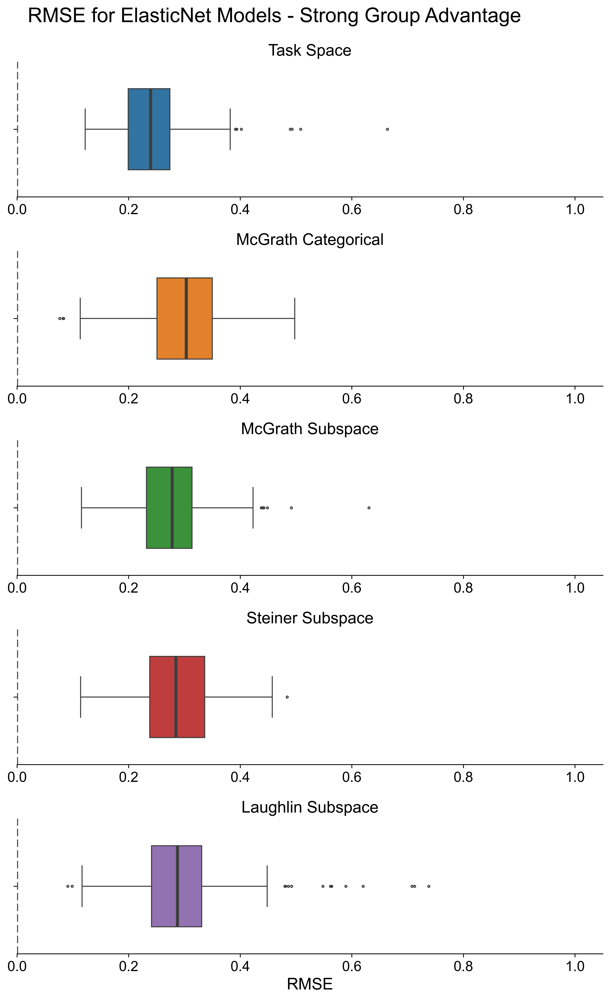


E-Net
Task Space vs McGrath Categorical - strong: t-statistic = -8.3828e+00 (down), adjusted p-value = 5.3319e-15
Task Space vs McGrath Subspace - strong: t-statistic = -5.3766e+00 (down), adjusted p-value = 2.9226e-07
Task Space vs Steiner Subspace - strong: t-statistic = -6.6902e+00 (down), adjusted p-value = 2.0026e-10
Task Space vs Laughlin Subspace - strong: t-statistic = -6.9688e+00 (down), adjusted p-value = 5.0889e-11
McGrath Categorical vs McGrath Subspace - strong: t-statistic = 3.4503 (up), adjusted p-value = 0.0012
McGrath Categorical vs Steiner Subspace - strong: t-statistic = 2.1214 (up), adjusted p-value = 0.0491
McGrath Categorical vs Laughlin Subspace - strong: t-statistic = 0.7484 (up), adjusted p-value = 0.4545
McGrath Subspace vs Steiner Subspace - strong: t-statistic = -1.3957 (down), adjusted p-value = 0.2043
McGrath Subspace vs Laughlin Subspace - strong: t-statistic = -2.4028 (down), adjusted p-value = 0.0277
Steiner Subspace vs Laughlin Subspace - strong: t-st

In [27]:
analyze_bootstrap_r2_boxplot(filter_dict_by_model_type(BOOTSTRAP_RMSE_RESULTS, "E-Net"), "RMSE for ElasticNet Models -", "strong", xlim_min=0, xlab = "RMSE")

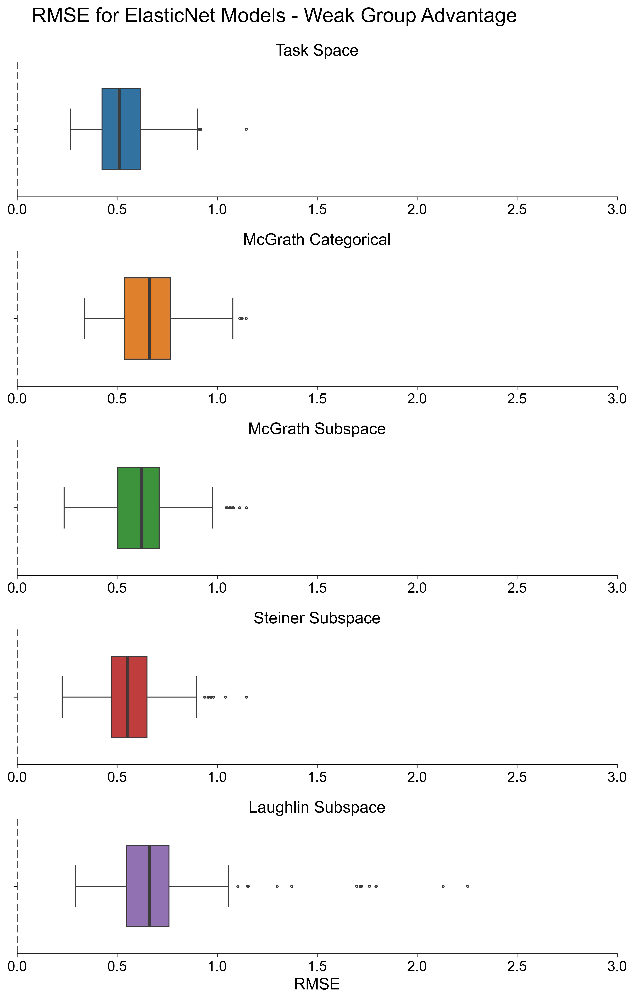


E-Net
Task Space vs McGrath Categorical - weak: t-statistic = -1.0031e+01 (down), adjusted p-value = 1.0814e-20
Task Space vs McGrath Subspace - weak: t-statistic = -6.6951e+00 (down), adjusted p-value = 1.4567e-10
Task Space vs Steiner Subspace - weak: t-statistic = -3.2417 (down), adjusted p-value = 0.0016
Task Space vs Laughlin Subspace - weak: t-statistic = -8.6238e+00 (down), adjusted p-value = 4.3477e-16
McGrath Categorical vs McGrath Subspace - weak: t-statistic = 3.0861 (up), adjusted p-value = 0.0024
McGrath Categorical vs Steiner Subspace - weak: t-statistic = 6.7808e+00 (up), adjusted p-value = 1.1315e-10
McGrath Categorical vs Laughlin Subspace - weak: t-statistic = -1.6781 (down), adjusted p-value = 0.0939
McGrath Subspace vs Steiner Subspace - weak: t-statistic = 3.5374 (up), adjusted p-value = 6.3121e-04
McGrath Subspace vs Laughlin Subspace - weak: t-statistic = -3.8825 (down), adjusted p-value = 1.9557e-04
Steiner Subspace vs Laughlin Subspace - weak: t-statistic = -6

In [28]:
analyze_bootstrap_r2_boxplot(filter_dict_by_model_type(BOOTSTRAP_RMSE_RESULTS, "E-Net"), "RMSE for ElasticNet Models -", "weak", xlim_min=0, xlim_max=3, xlab = "RMSE")

## Permutation/SHAP Interpretation Plots

In [29]:
def model_predict(fitted_model, X, model_type):
	if model_type == "LM":
		X = sm.add_constant(X, has_constant='add')
		return fitted_model.predict(X)
	elif model_type == "NN":
		return fitted_model.predict(X).flatten()
	elif model_type == "E-Net":
		X = add_interactions(X)
		return fitted_model.predict(X)

In [30]:
def plot_combined_feature_importance(
	model, wave_a_data, wave_b_data, ivs, dv_type, model_type, 
	save_path='./visualizations/combined_importance.png', n_repeats=100):
	
	set_random_seeds()

	X_test = wave_b_data[ivs].copy()
	y_test = wave_b_data[dv_type].values
	y_pred = model_predict(model, X_test, model_type)
	base_rmse = np.sqrt(mean_squared_error(y_test, y_pred))

	# Map features to their groups using the provided dictionary
	feature_to_group = {}
	for key, group_name in pretty_feature_cluster_names.items():
		try:
			feature_list = ast.literal_eval(key)
			features = feature_list if isinstance(feature_list, list) else [feature_list]
		except (ValueError, SyntaxError):
			features = [key]
		for feature in features:
			feature_to_group[feature] = group_name

	# Create a mapping from groups to features
	group_to_features = {}
	for feature in ivs:
		group_name = feature_to_group.get(feature, feature)
		group_to_features.setdefault(group_name, []).append(feature)
		feature_to_group[feature] = group_name

	groups = list(group_to_features.keys())
	importances = np.zeros(len(groups))
	conf_intervals = np.zeros(len(groups))

	# Calculate permutation feature importance for each group
	for i, group_name in enumerate(groups):
		features_in_group = group_to_features[group_name]
		scores = np.zeros(n_repeats)
		for n in range(n_repeats):
			X_permuted = X_test.copy()
			permutation = np.random.permutation(len(X_test))
			for feature in features_in_group:
				X_permuted[feature] = X_permuted[feature].values[permutation]
			y_permuted_pred = model_predict(model, X_permuted, model_type)
			permuted_rmse = np.sqrt(mean_squared_error(y_test, y_permuted_pred))
			scores[n] = ((permuted_rmse - base_rmse) / base_rmse) * 100
		importances[i] = scores.mean()
		conf_intervals[i] = 1.96 * scores.std(ddof=1) / np.sqrt(n_repeats)

	exclude_groups = ["Generate", "High", "Medium", "Low", "playerCount"]
	display_indices = [i for i, group_name in enumerate(groups) if group_name not in exclude_groups]
	importances_display = importances[display_indices]
	conf_intervals_display = conf_intervals[display_indices]
	groups_display = [groups[i] for i in display_indices]

	sorted_indices = np.argsort(importances_display)
	sorted_group_names = np.array(groups_display)[sorted_indices]
	importances_sorted = importances_display[sorted_indices]
	conf_intervals_sorted = conf_intervals_display[sorted_indices]
	
	# Configure matplotlib for the desired style
	plt.style.use('default')
	matplotlib.rcParams.update({
		'figure.figsize': (40, 4.72),
		'font.size': 18,
		'font.sans-serif': ['Arial'],
		'axes.facecolor': 'white',
		'axes.edgecolor': '#666666',
		'axes.linewidth': 0.5,
		'grid.alpha': 0.0,
		'pdf.fonttype': 42,
		'ps.fonttype': 42
	})
	
	# Define the figure and grid specs for the plots
	fig = plt.figure(figsize=(40, 4.72), dpi=300)
	gs = plt.GridSpec(1, 2, width_ratios=[2, 1], wspace=0.2)
	ax_left = fig.add_subplot(gs[0])
	ax_right = fig.add_subplot(gs[1], sharey=ax_left)  # Use sharey for alignment

	# Left plot
	ax_left.barh(
		range(len(sorted_group_names)),
		importances_sorted,
		xerr=conf_intervals_sorted,
		align='center',
		alpha=0.7,
		capsize=3,
		height=0.9,
		color="#1f77b4"# ,
		# edgecolor='k'
	)
	ax_left.set_yticks(range(len(sorted_group_names)))
	ax_left.set_yticklabels(sorted_group_names, fontsize=22)
	ax_left.invert_yaxis()
	ax_left.set_xlabel("Feature Importance\n(% Change in RMSE)", fontsize=22)
	ax_left.axvline(x=0, linestyle='--', color='#666666', linewidth=0.8, zorder=0)
	ax_left.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

	# Remove top and right spines
	ax_left.spines['top'].set_visible(False)
	ax_left.spines['right'].set_visible(False)

	# Adjust tick parameters
	ax_left.tick_params(axis='y', which='major', labelsize=22, length=3, width=0.5)
	ax_left.tick_params(axis='x', which='major', labelsize=22, length=3, width=0.5)
	ax_left.set_ylim(-0.5, len(sorted_group_names) - 0.5)

	explainer = shap.Explainer(lambda inputs: model_predict(model, inputs, model_type), X_test)
	shap_values = explainer(X_test)

	shap_values_df = pd.DataFrame(shap_values.values, columns=shap_values.feature_names)
	feature_values_df = pd.DataFrame(shap_values.data, columns=shap_values.feature_names)

	# Group SHAP values and feature values by the defined groups
	grouped_shap_values_df = pd.DataFrame(index=shap_values_df.index)
	grouped_feature_values = pd.DataFrame(index=feature_values_df.index)
	for group_name, features in group_to_features.items():
		existing_features = [f for f in features if f in shap_values.feature_names]
		if existing_features:
			grouped_shap_values_df[group_name] = shap_values_df[existing_features].sum(axis=1)
			grouped_feature_values[group_name] = feature_values_df[existing_features].mean(axis=1)

	grouped_shap_values_df = grouped_shap_values_df[[col for col in grouped_shap_values_df.columns if col not in exclude_groups]]
	grouped_feature_values = grouped_feature_values[[col for col in grouped_feature_values.columns if col not in exclude_groups]]

	# Sort SHAP values according to importance order
	sorted_group_order = [group for group in sorted_group_names if group in grouped_shap_values_df.columns][::-1]
	order = [grouped_shap_values_df.columns.get_loc(group) for group in sorted_group_order]

	# Create a SHAP Explanation object
	explanation = shap.Explanation(
		values=grouped_shap_values_df.values,
		base_values=shap_values.base_values,
		data=grouped_feature_values.values,
		feature_names=grouped_shap_values_df.columns
	)

	# Right plot using SHAP beeswarm
	plt.sca(ax_right)
	shap.plots.beeswarm(
		explanation,
		show=False,
		color_bar=True,
		max_display=len(order),
		alpha=0.5,
		order=order
	)
	
	# format the x-axis with one decimal place
	ax = plt.gca()
	ax.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

	# Hide y-tick labels on the right, maintain shared y-axis alignment
	ax_right.tick_params(axis='y', labelleft=False)
	ax_right.tick_params(axis='x', labelsize=22)

	# Adjust the colorbar labels and tick parameters
	fig = plt.gcf()
	fig.set_size_inches(12, 8) # set figure size
	for obj in fig.get_children():
		if isinstance(obj, plt.Axes) and 'colorbar' in obj.get_label():
			obj.tick_params(labelsize=22)
			obj.set_ylabel(obj.get_ylabel(), fontsize=22)

	# Style adjustments for the right plot
	ax_right.set_xlabel("SHAP Value\n(Impact on Model Output)", fontsize=22, labelpad=10)

	plt.tight_layout()
	plt.savefig(save_path, dpi=300, bbox_inches='tight', metadata={'Creator': 'Matplotlib'})
	plt.show()

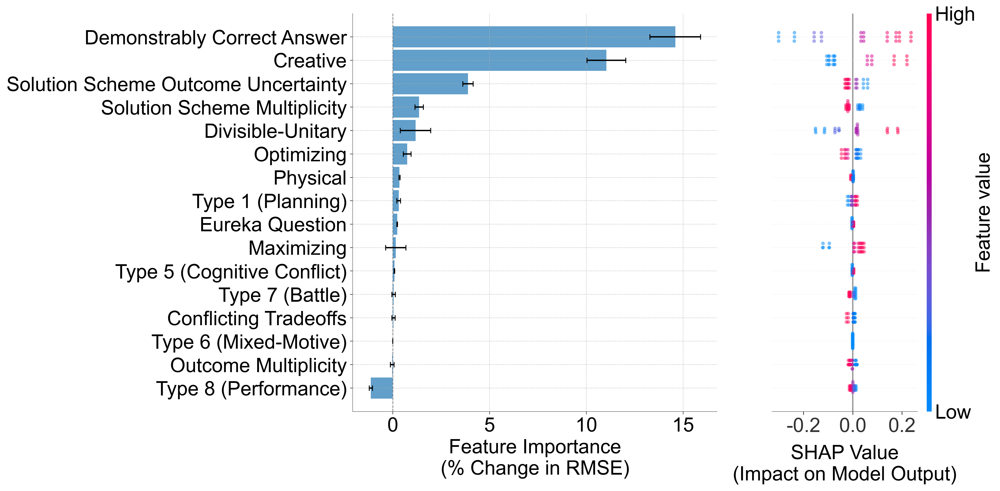

In [31]:
# ENet with interactions - Weak Synergy (Train Waves 1-2, Predict Wave 3)
plot_combined_feature_importance(
	model = MODELS["Task Space"]["E-Net"]["Wave 2"]["weak"],
	wave_a_data = TRAIN_TEST_DATA["Wave 2"]["train"],
	wave_b_data = TRAIN_TEST_DATA["Wave 2"]["test"],
	ivs = basic_IVs,
	dv_type = "weak",
	model_type = "E-Net",
	save_path = '../outputs/combined_importance_enet_weak_wave3.png'
)

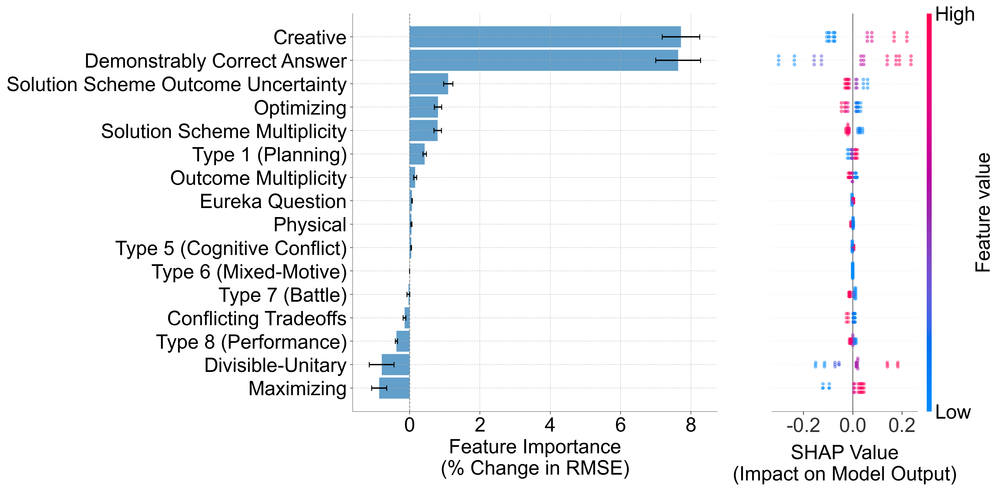

In [32]:
# E-Net - Strong Synergy (Train Waves 1-2, Predict Wave 3)
plot_combined_feature_importance(
	model = MODELS["Task Space"]["E-Net"]["Wave 2"]["weak"],
	wave_a_data = TRAIN_TEST_DATA["Wave 2"]["train"],
	wave_b_data = TRAIN_TEST_DATA["Wave 2"]["test"],
	ivs = basic_IVs,
	dv_type = "strong",
	model_type = "E-Net",
	save_path = '../outputs/combined_importance_enet_strong_wave3.png'
)

# Robustness Checks

## Checking Robustness to Noise

In [33]:
def plot_model_performance(data, y_label='RMSE', output_file='../outputs/model_performance'):
	"""
	Plot model performance against the number of affected columns for different noise levels, with baselines.
	Generates faceted plots for both 'strong' and 'weak' groups.

	Parameters:
	- data: dict, the dictionary containing model performance data.
	- y_label: str, label for the y-axis ('RMSE' or 'R^2').
	- output_file: str, path to save the plotted figure.
	"""
	noise_levels = [0.25, 0.5, 0.75, 1.0]
	affected_columns = sorted(data.keys())

	if y_label == 'RMSE':
		baselines = MODEL_RMSE_RESULTS
	else:
		baselines = MODEL_R2_RESULTS

	dv_types = ['strong', 'weak']
	dv_labels = ["DV: Strong Group Advantage", "DV: Weak Group Advantage"]

	fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 15), sharex=True)
	colors = plt.cm.Dark2(np.linspace(0, 1, len(noise_levels) + len(baselines)))

	for i, (ax, dv_type, dv_label) in enumerate(zip(axes, dv_types, dv_labels)):
		for idx, noise in enumerate(noise_levels):
			performance = [data[col][noise][dv_type] for col in affected_columns]
			ax.plot(affected_columns, performance, label=f'Noise SD={noise}', color=colors[idx])

		baseline_labels = ["Task Space", "McGrath Categorical", "McGrath Subspace"]
		for idx, label in enumerate(baseline_labels, start=len(noise_levels)):
			baseline_value = baselines[label]["E-Net"]["Wave 2"][dv_type]
			ax.axhline(y=baseline_value, color=colors[idx], linestyle='--', label=f'{label} Baseline')
			ax.text(max(affected_columns) + 0.2, baseline_value + 0.0001, f"{baseline_value:.2f}", color=colors[idx], fontsize=12)

		ax.set_ylabel(y_label, fontsize=14)
		ax.set_title(dv_label, fontsize=16)
		ax.grid(True)

		# Panel labels
		ax.text(-0.05, 1.05, f'{chr(65+i)}', transform=ax.transAxes, 
				fontsize=16, fontweight='bold', va='top', ha='right')

	plt.xticks(affected_columns, fontsize=14)
	plt.xlabel('Number of Task Columns Affected by Noise', fontsize=14)
	plt.suptitle(f'Model Performance ({y_label}) in Response to Training Data', fontsize=16)

	# Adjust legend to be below title
	handles, labels = axes[0].get_legend_handles_labels()
	fig.legend(handles, labels, loc='upper center', ncol=4, fontsize=14, bbox_to_anchor=(0.5, 0.96), frameon=False)

	plt.tight_layout(rect=[0, 0.03, 1, 0.93])
	plt.savefig(output_file + ".png")
	plt.savefig(output_file + ".pdf")

	plt.show()

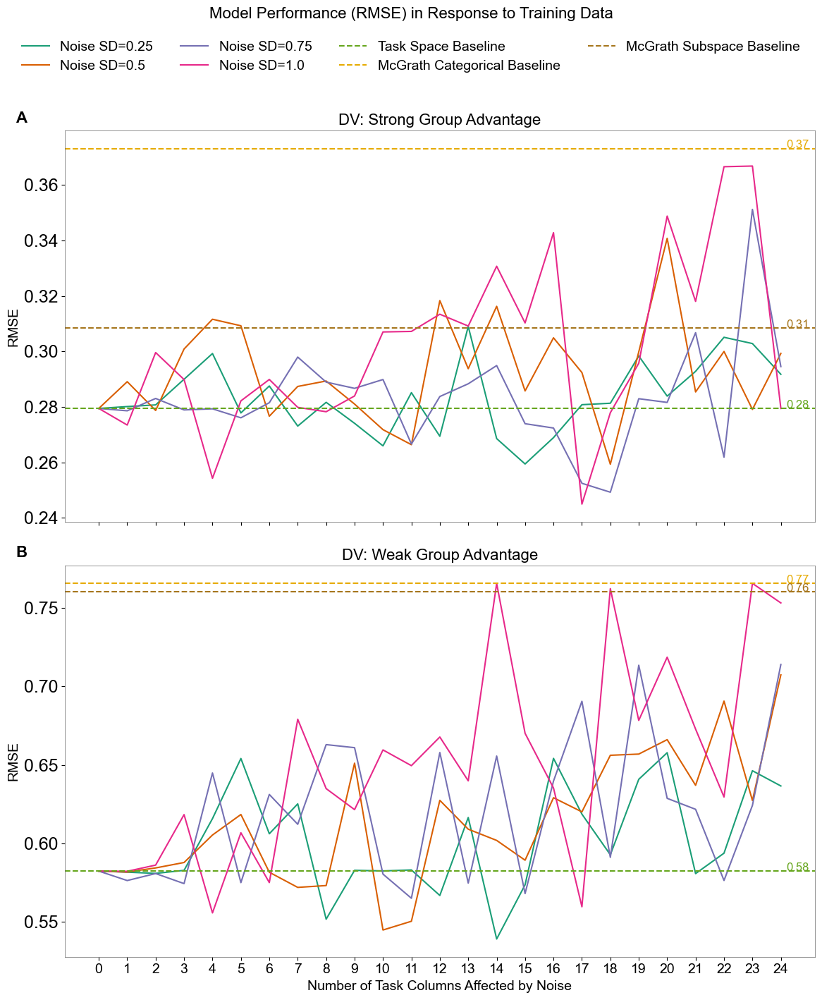

In [34]:
plot_model_performance(ENETS_NOISE_ROBUSTNESS_RMSE_RESULTS, y_label='RMSE', output_file='../outputs/enet_noise_robustness_rmse')

## Are Task Relationships Robust to Noise?

In [35]:
""""
 WANT TO SHOW:
 Two features that are farther away in a lower-dimensional representation of the space should also be
 further away in a higher dimensional representation of the space.

 HOW TO SHOW:
 - Choose every possible combination of 3 tasks.
 - Measure whether cosine_distance(task 1, task 2) is smaller than cosine_distance(task 1, task 3)
	 - Positive if task 1 and task 2 are closer; Negative if 1 and 3 are closer
 - Ideally, all signs should be the same, so we'll return the % of signs that are the same

 This code is commented out because it takes several hours to run, but it is here for reproducibility. The
 saved output is read in as a .pkl file.

"""""
# consistency_dict_for_num_features = defaultdict(list)

# def process_tasks_for_combination(three_tasks, all_combinations_of_i_features):
#     try:
#         signs = []
#         for task_feature_combination in random.sample(all_combinations_of_i_features, 10):
#             diff = check_similarity_robustness_example_3_tasks(
#                 list(task_feature_combination), three_tasks[0], three_tasks[1], three_tasks[2]
#             )
#             signs.append(np.sign(diff))

#         # Compare the signs to 'perfect performance'
#         modal_sign = mode(signs)
#         consistency_pct = np.mean([(item == modal_sign) for item in signs])
#         return consistency_pct

#     except Exception as e:
#         print(f"Error processing tasks for combination {three_tasks}: {e}")
#         return None

# for i in range(2, 24):
#     print(f"Starting experiments for {i} features...")
	
#     all_combinations_of_i_features = list(itertools.combinations(task_map.drop("task_name", axis=1).columns, i))
#     all_three_task_combinations = list(itertools.combinations(task_map["task_name"].drop_duplicates(), 3))
	
#     with tqdm(total=len(all_three_task_combinations), desc=f"Processing {i} features") as pbar:
#         with concurrent.futures.ThreadPoolExecutor(max_workers=multiprocessing.cpu_count()) as executor:
#             futures = [executor.submit(process_tasks_for_combination, three_tasks, all_combinations_of_i_features) 
#                        for three_tasks in all_three_task_combinations]
		  
#             for future in concurrent.futures.as_completed(futures):
#                 result = future.result()
#                 if result is not None:
#                     consistency_dict_for_num_features[i].append(result)
#                 pbar.update()

# # Save the dictionary to a file
# with open('./saved_outputs/consistency_dict_for_num_features.pkl', 'wb') as file:
#     pickle.dump(consistency_dict_for_num_features, file)

'"\n WANT TO SHOW:\n Two features that are farther away in a lower-dimensional representation of the space should also be\n further away in a higher dimensional representation of the space.\n\n HOW TO SHOW:\n - Choose every possible combination of 3 tasks.\n - Measure whether cosine_distance(task 1, task 2) is smaller than cosine_distance(task 1, task 3)\n\t - Positive if task 1 and task 2 are closer; Negative if 1 and 3 are closer\n - Ideally, all signs should be the same, so we\'ll return the % of signs that are the same\n\n This code is commented out because it takes several hours to run, but it is here for reproducibility. The\n saved output is read in as a .pkl file.\n\n'

In [36]:
with open('../outputs/consistency_dict_for_num_features.pkl', 'rb') as file:
	consistency_dict_for_num_features = pickle.load(file)

# Initialize lists to store x-values (number of features), means, and CIs
num_features = []
means = []
lower_bounds = []
upper_bounds = []

# Calculate mean and 95% CI for each entry in the dictionary
for key, values in sorted(consistency_dict_for_num_features.items()):
	num_features.append(key)
	mean_val = np.mean(values)
	means.append(mean_val)
	
	# Calculate 95% CI
	n = len(values)
	if n > 1:  
		h = stats.sem(values) * stats.t.ppf((1 + 0.95) / 2, n - 1)
	else:
		h = 0  # In case of a single value, CI is zero (no spread)
	
	lower_bounds.append(mean_val - h)
	upper_bounds.append(mean_val + h)
	
def check_similarity_robustness_example_3_tasks(features, task_1 = "Moral Reasoning (Disciplinary Action Case)", task_2 = "Allocating resources to programs", task_3 = "Sudoku"):
	
	task_map_copy = pd.read_csv("./data/task_map.csv").rename(columns = {"task": "task_name"}).copy()

	# filter down to a set of features
	task_map_copy = task_map_copy[["task_name"] + features]
	
	task_1_vec = np.asarray(task_map_copy[task_map_copy["task_name"] == task_1].drop("task_name",axis=1)).flatten()
	task_2_vec = np.asarray(task_map_copy[task_map_copy["task_name"] == task_2].drop("task_name",axis=1)).flatten()
	task_3_vec = np.asarray(task_map_copy[task_map_copy["task_name"] == task_3].drop("task_name",axis=1)).flatten()
	
	# get similarity between task 1 and task 2
	vec_1_2_sim = distance.cosine(task_1_vec, task_2_vec)
	vec_1_3_sim = distance.cosine(task_2_vec, task_3_vec)

	# 1 and 2 are closer than 1 and 3
	diff = vec_1_3_sim-vec_1_2_sim

	return(diff)

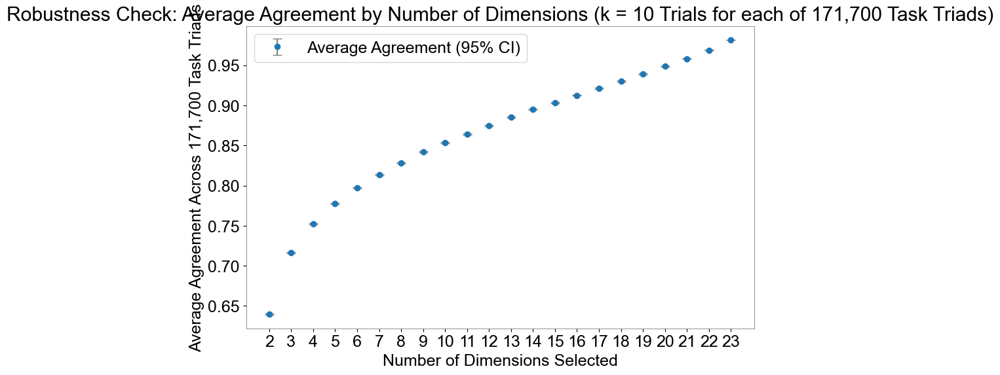

In [37]:
plt.figure(figsize=(10, 6))
plt.errorbar(num_features, means, yerr=[np.array(means) - np.array(lower_bounds), np.array(upper_bounds) - np.array(means)], 
			 fmt='o', capsize=5, capthick=1, ecolor='gray', label='Average Agreement (95% CI)')
plt.xlabel('Number of Dimensions Selected')
plt.ylabel('Average Agreement Across 171,700 Task Triads')
plt.title('Robustness Check: Average Agreement by Number of Dimensions (k = 10 Trials for each of 171,700 Task Triads)')
plt.xticks(np.arange(min(num_features), max(num_features) + 1, 1))

plt.grid(True)
plt.legend()
plt.savefig('../outputs/robustness_check_average_agreement.png', dpi=300, bbox_inches='tight')
plt.savefig('../outputs/robustness_check_average_agreement.pdf', bbox_inches='tight')
plt.show()

# Task Map Heatmap

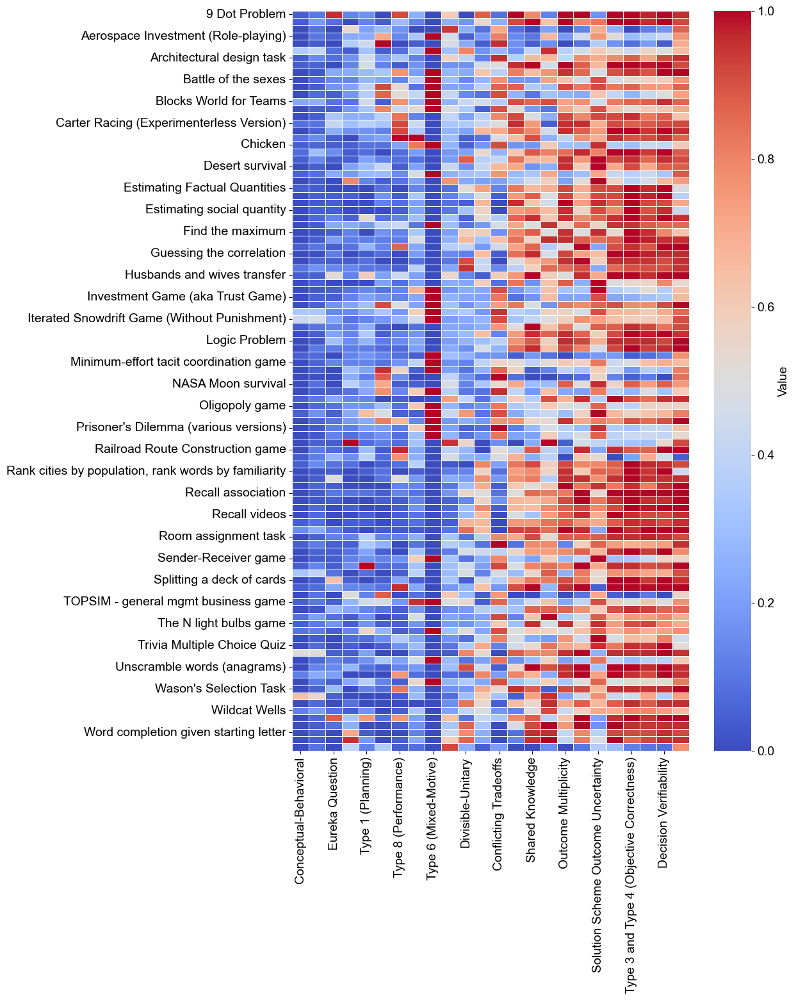

In [38]:
task_map = pd.read_csv("../data/task_map.csv").rename(columns={"task": "task_name"})
task_map.set_index('task_name', inplace=True)

# filter out _cat columns
task_map = task_map[[col for col in task_map.columns if "_cat" not in col]]

# Calculate the average values for each dimension
column_means = task_map.mean().sort_values()

# Sort the DataFrame columns by the average values
task_map = task_map[column_means.index]
# sort the index alphabetically
task_map.sort_index(inplace=True)

# Create the heatmap
plt.figure(figsize=(10, 15))
ax = sns.heatmap(task_map, cmap='coolwarm', center=0.5, linewidths=0.5, cbar_kws={'label': 'Value'})

ax.figure.axes[-1].yaxis.label.set_size(14)
ax.figure.axes[-1].tick_params(labelsize=14)

plt.ylabel('')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.savefig("../outputs/heatmap_task_map.pdf", bbox_inches='tight')
plt.savefig("../outputs/heatmap_task_map.png", bbox_inches='tight')
plt.show()